# GIK2FB Artificial Intelligence HT22

## Lab 4: ML - Supervised Regression Learning, Naive Bayes (Probabilistic Classifier)

Dalarna University
(c) Joonas Pääkkönen, fall 2022

### Deadline: Monday Dec 19th, 2022, 23:59 CET time

Upload your .ipynb file to Learn. No video, just the .ipynb file. Simply write your code in the .ipynb file and submit it. Do not zip anything, like the datasets, with it.

Use Scikit-learn first and foremost, with the help of Pandas, NumPy, SciPy, Matplotlib and Seaborn, if needed. Remember that Pandas dataframes come in very handy in data science.

Note: plotting pairplots may take several seconds or even minutes.

Make sure that your code runs before submitting.

Remember to fill in the information below, i.e., student name(s) and email address(es).

### Student name(s): Simon Stålnäbb | Nicklas Clarke

### DU email address(es): h21simos@du.se | h21nikcl@du.se

Good luck!

### Task 1: Linear regression

Task 1.1: Import Pandas, and download the hungary_chickenpox.csv dataset from
https://archive.ics.uci.edu/ml/datasets/Hungarian+Chickenpox+Cases and save the data into a variable called "chickendata" with the read.csv() method of the Pandas module.

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import PolynomialFeatures

Task 1.2: Print the chickendata dataset by simply writing the variable name.

In [3]:
# Import our "Hungarian Chickenpox" dataset.
chickendata = pd.read_csv('data/hungary_chickenpox.csv', delimiter=',')

Task 1.3: Use the Pandas describe() method to describe chickendata.

In [4]:
# Describe the columns in the dataset.
chickendata.describe()

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
count,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000
mean,101.245211,34.204981,37.166667,28.911877,57.082375,31.488506,33.272031,41.436782,47.097701,29.691571,40.869732,25.643678,21.850575,86.101533,27.609195,29.854406,20.352490,22.467433,40.636015,19.873563
std,76.354872,32.567222,36.843095,37.618092,50.725437,33.790208,31.397989,36.014297,44.610836,31.857750,37.283299,24.467995,22.025999,66.773741,26.724236,31.814630,23.273025,25.006638,40.699471,21.999636
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34.250000,8.000000,8.000000,4.000000,14.250000,6.000000,7.000000,9.000000,11.000000,6.250000,10.000000,6.000000,4.000000,28.250000,6.000000,6.000000,4.000000,3.000000,7.250000,4.000000
50%,93.000000,25.000000,29.500000,14.000000,46.500000,20.500000,24.000000,35.000000,37.000000,21.000000,31.000000,19.000000,15.000000,81.000000,20.500000,18.500000,12.000000,13.000000,32.000000,13.000000
75%,149.000000,51.000000,53.000000,38.750000,83.750000,47.000000,51.750000,63.000000,68.000000,41.000000,61.750000,39.000000,32.750000,129.750000,41.000000,45.000000,29.000000,34.000000,59.000000,31.000000
max,479.000000,194.000000,274.000000,271.000000,355.000000,199.000000,164.000000,181.000000,262.000000,210.000000,224.000000,160.000000,112.000000,431.000000,155.000000,203.000000,131.000000,141.000000,230.000000,216.000000


Task 1.4: Use Seaborn to plot the pairplot of the dataset.

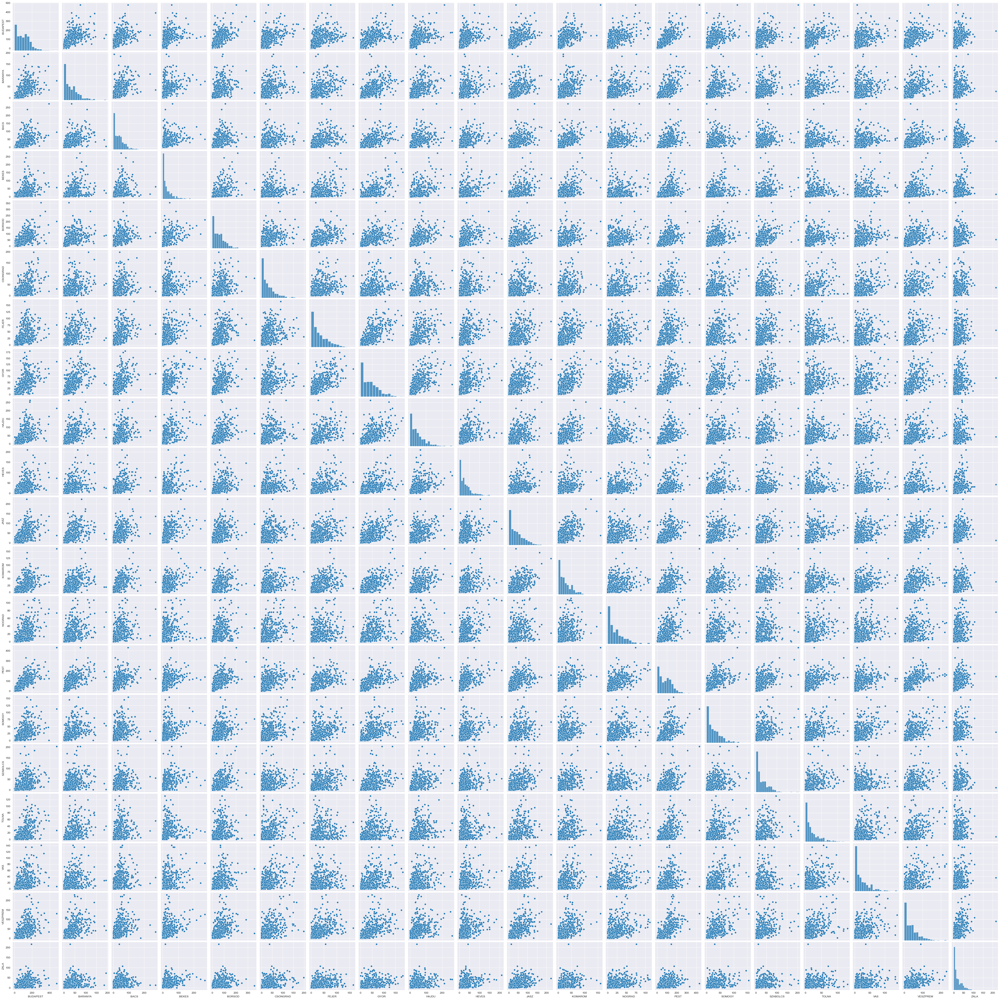

In [5]:
areas = []                                      # Create a new list object for holding our areas headers
for header in chickendata.columns:              # Loop over all of the columns in the dataset
    if header == "Date": continue               # Check if the header for the column is "Date"
    areas.append(header)                        # If it isn't then add it to the areas list
sns.pairplot(data=chickendata, vars=areas)      # PairPlot the Areas data

Task 1.5: Use the scatterplot() method of Seaborn to plot a scatterplot where the x-coordinates are from the BUDAPEST column and the y-coordinates are from the VAS column.

<AxesSubplot:xlabel='BUDAPEST', ylabel='VAS'>

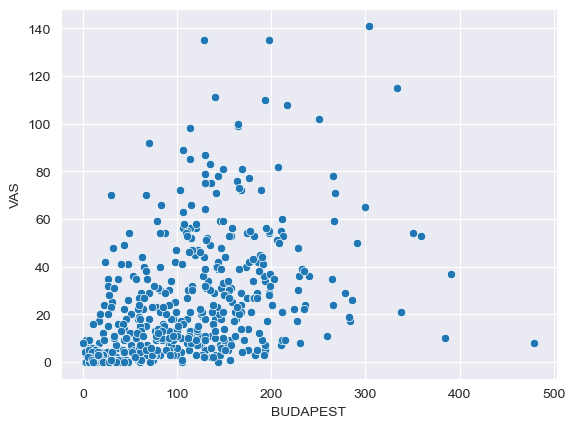

In [6]:
# Scatterplot out 'BUDAPEST' and 'VAS' in comparison
sns.scatterplot(data=chickendata, x=chickendata['BUDAPEST'], y=chickendata['VAS'])

Task 1.6: Use Scikit-learn to fit a simple linear OLS regression line to the data visualized in Task 1.5. Plot the linear regression line alongside the scatterplot of Task 1.5. Make sure the line and the scatterplot points are in different colors. Note: you may need to reshape the data first.

Coefficients: [[0.15898364]]
Mean Squared Error: 477.06
Coefficient of Determination: 0.24


([], [])

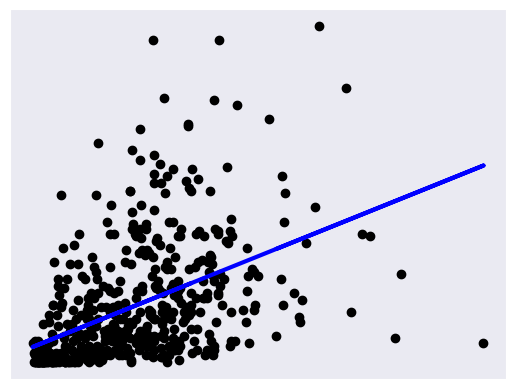

In [7]:
chicken_x = chickendata['BUDAPEST']                                                 # Grab the 'BUDAPEST' data as the X-Axis
chicken_y = chickendata['VAS']                                                      # Grab the 'VAS' data as the Y-Axis

chicken_x = chicken_x.to_numpy().reshape(-1, 1)                                     # Convert the X-DataFrame to a numpy array and reshape it to be 1D
chicken_y = chicken_y.to_numpy().reshape(-1, 1)                                     # Convert the Y-DataFrame to a numpy array and reshape it to be 1D

regression = LinearRegression()                                                     # Setup a LinearRegression model
regression.fit(chicken_x, chicken_y)                                                # Fit the X and Y arrays to the model
chicken_y_pred = regression.predict(chicken_x)                                      # Predict Y using X

print("Coefficients:", regression.coef_)                                            # Print the Co-Efficients of the model
print("Mean Squared Error: %.2f" % mean_squared_error(chicken_y, chicken_y_pred))   # Print the MSE (Mean-Squared Error) for the model
print("Coefficient of Determination: %.2f" % r2_score(chicken_y, chicken_y_pred))   # Print the Co-Efficient of Determination of the model

plt.scatter(chicken_x, chicken_y, color="black")                                    # Scatterplot the X and Y data
plt.plot(chicken_x, chicken_y_pred, color="blue", linewidth=3)                      # Provide a regression line of X and Y_Pred data
plt.xticks(())                                                                      # Disable X-Axis Ticks
plt.yticks(())                                                                      # Disable Y-Axis Ticks

Task 1.7: What is the value of the coefficient of determination for the linear regression model of Task 1.6?

In [8]:
text = "The Co-Efficient of Determination is %.2f"  # Text Output
print(text % r2_score(chicken_y, chicken_y_pred))   # Print

The Co-Efficient of Determination is 0.24


Task 1.8: Use Scikit-learn to fit an ordinary least squares linear regression model to predict the values of the BUDAPEST column with all the other data columns of the chickendata dataset, not only with the VAS column. Find the $R^2$-value for the prediction. Similarly, fit a Ridge regression model and also a LASSO regression model to the same data. Find the corresponding $R^2$-values for these two models as you did for the simple linear regression model. That is, you need to print all the three coefficients of determination to pass this task.

In [9]:
chicken_x = chickendata.drop(labels=['Date', 'BUDAPEST'], axis=1)                                   # Drop Date and Budapest for X
chicken_y = chickendata['BUDAPEST']                                                                 # Grab Budapest data for Y
chicken_y = chicken_y.to_numpy().reshape(-1, 1)                                                     # Reshape Y to be a 1D array

ols = LinearRegression()                                                                            # Setup LinearRegression Model
ridge = Ridge()                                                                                     # Setup Ridge Model
lasso = Lasso()                                                                                     # Setup Lasso Model

ols.fit(chicken_x, chicken_y)                                                                       # Fit X & Y to LinearRegression model
ridge.fit(chicken_x, chicken_y)                                                                     # Fit X & Y to Ridge model
lasso.fit(chicken_x, chicken_y)                                                                     # Fit X & Y to Lasso model

ols_y_pred = ols.predict(chicken_x)                                                                 # Print using LinearRegression
ridge_y_pred = ridge.predict(chicken_x)                                                             # Predict using Ridge
lasso_y_pred = lasso.predict(chicken_x)                                                             # Predict using Lasso

print("Coefficients [OLS, Ridge, Lasso]:", "\n", ols.coef_, "\n", ridge.coef_, "\n", lasso.coef_)   # Print the Co-Efficients of the models
print("Mean Squared Error [OLS, Ridge, Lasso]: [" +                                                 # Print the MSEs of the models
      str(mean_squared_error(chicken_y, ols_y_pred)),
      str(mean_squared_error(chicken_y, ridge_y_pred)),
      str(mean_squared_error(chicken_y, lasso_y_pred)) + "]")
print("Coefficient of Determination [OLS, Ridge, Lasso]: [" +                                       # Print the CoD of the models
      str(r2_score(chicken_y, ols_y_pred)),
      str(r2_score(chicken_y, ridge_y_pred)),
      str(r2_score(chicken_y, lasso_y_pred)) + "]")

Coefficients [OLS, Ridge, Lasso]: 
 [[-0.15646341  0.22087773 -0.04243481  0.28655075  0.41294833 -0.14402838
   0.12372446  0.07193781 -0.13909798  0.15363807  0.20488909  0.53786186
   0.38143568  0.1710726  -0.03841412  0.34595445 -0.1769806  -0.15348159
   0.21290604]] 
 [[-0.15646122  0.22087742 -0.04243463  0.28655028  0.41294703 -0.14402775
   0.12372431  0.07193775 -0.13909604  0.15363693  0.20488705  0.53785782
   0.38143561  0.17107093 -0.03841287  0.34595313 -0.17697716 -0.15347979
   0.21290483]] 
 [-0.15143787  0.21991387 -0.04001587  0.28523     0.41030876 -0.14026753
  0.12023945  0.07103972 -0.13533064  0.15006046  0.2006152   0.53419334
  0.38089183  0.16517468 -0.03416359  0.34376019 -0.16793044 -0.14853858
  0.20779441]
Mean Squared Error [OLS, Ridge, Lasso]: [1627.3356922224148 1627.335692234299 1627.403168448464]
Coefficient of Determination [OLS, Ridge, Lasso]: [0.7203360896133673 0.720336089611325 0.7203244935638704]


Task 1.9: Now you have three different models and three different $R^2$-values. In terms of the $R^2$-value, which model performs the best? How would you comment these results in your own words? Enter your answer here:

In [10]:
ols_text = "OLS: 0.7203360896133673"            # LinearRegression Accuracy
ridge_text = "Ridge: 0.7203360896113250"        # Ridge Accuracy
lasso_text = "Lasso: 0.72032449356387041"       # Lasso Accuracy

print("Out of the three regression models the one with the highest R^2 value is OLS however the difference between ols and ridge is: 0,0000000000020423")

Out of the three regression models the one with the highest R^2 value is OLS however the difference between ols and ridge is: 0,0000000000020423


### Task 2: Binary classification with logistic regression and Gaussian Naive Bayes

Task 2.1: Download the DryBeanDataset.zip file from
https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset and save Dry_Bean_Dataset.xlsx to variable "beandata". You need to read an .xlsx file now.

In [11]:
# Import Dry Bean Data
beandata = pd.read_excel('data/Dry_Bean_Dataset.xlsx')

Task 2.2: Print the beandata dataset by simply writing the variable name.

In [12]:
# Print the dataset
beandata

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


Task 2.3: Use the describe() method to describe the dataset.

In [13]:
# Describe the beandata
beandata.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


Task 2.4: What is the range (the difference between the maximum and the minimum) of the Area feature?

In [14]:
area = beandata['Area']                                                 # Grab the Area feature from the beandata
print("The range of Area is: ", (int(area.max()) - int(area.min())))    # Calculate the range using max-min calculation

The range of Area is:  234196


Task 2.5: Use Seaborn to plot the pairplots of the dataset with the hue argument set to the class of the bean. Note that there are several kinds of beans. Follow the link in Task 2.1 if you want to read more details about the data.

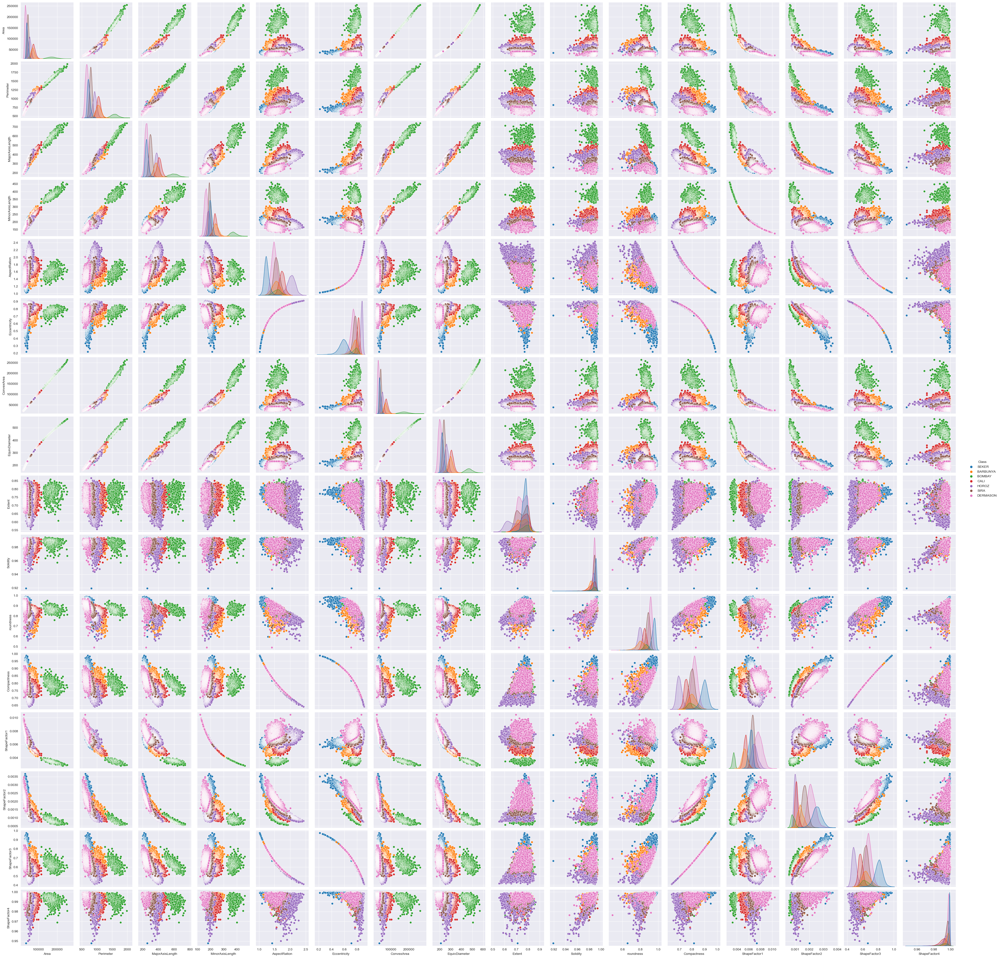

In [15]:
# Pairplot the beandata
sns.pairplot(data=beandata, hue='Class')

Task 2.6: Imagine that you were to use a regression model to predict the Eccentricity feature as the regression target variable with the AspectRation feature as the independent variable. By looking at the corresponding pairplot above, what type of a regression model would you choose? Motivate your answer in your own words.

Bonus: If you want, you can also apply the regression model of your choice here and plot the results, but this is not compulsory. Nonetheless, executing this bonus task can compensate for some shortcomings in the other tasks.

Answer:
Looking at the shape of the model being a curved line with a non-linear outline, I'd go with something like a Polynomial Regression


[Text(0.5, 0, ''), Text(0, 0.5, '')]

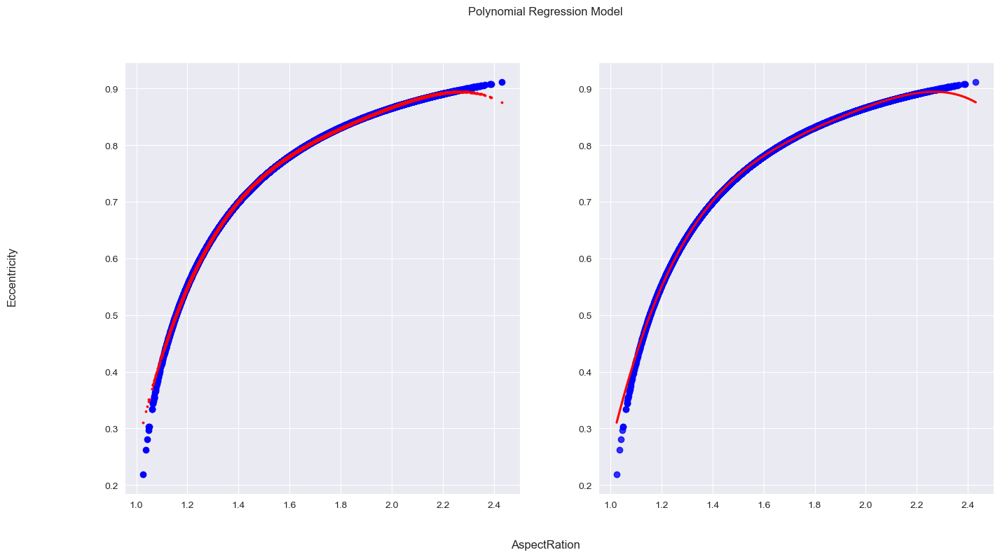

In [16]:
# Justify our choice in model
answer = "Answer:\nLooking at the shape of the model being a curved line with a non-linear outline, I'd go with something like a Polynomial Regression"
print(answer)

bean_x = beandata['AspectRation']                                           # Grab 'AspectRation' as the X-variable
bean_y = beandata['Eccentricity']                                           # Grab 'Eccentricity' as the Y-variable

poly_reg = PolynomialFeatures(degree=4, include_bias=False)                 # Set up a 4th degree PolynomialFeatures regression
poly_features = poly_reg.fit_transform(bean_x.to_numpy().reshape(-1, 1))    # Fit_Transform the data into a poly_features set
lin_reg = LinearRegression()                                                # Set up a LinearRegression model
lin_reg.fit(poly_features, bean_y)                                          # fit the poly_features and bean_y to the model
y_pred = lin_reg.predict(poly_features)                                     # Perform a LinearRegression prediction on the poly_features

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))                        # Set up a PyPlot Sub-Plot
fig.suptitle("Polynomial Regression Model")                                 # Title: Polynomial Regression Model
fig.supxlabel('AspectRation')                                               # X-Label: AspectRation
fig.supylabel('Eccentricity')                                               # Y-Label: Eccentricity

# Using my predicted and modeled curve
ax1.scatter(bean_x, bean_y, color='Blue')                                   # Scatterplot the X & Y data
ax1.scatter(bean_x, y_pred, color='Red', s=3)                               # Scatterplot the X and Y_Pred data

# Using the built-in polynomial regression from Seaborn
sns.regplot(x=bean_x, y=bean_y, order=4, ax=ax2, scatter_kws={"color": 'Blue'}, line_kws={"color": 'Red'}, ci=None).set(xlabel=None, ylabel=None)

Task 2.7: Let's say we are only interested in Bombay beans. Use Scikit-learn to build a logistic regression predictor based on the major axis length of the beans to separate Bombay beans from other beans. Plot the regression curve in the same figure with the corresponding scatterplot.

<AxesSubplot:title={'center':'Seaborn Logistic Model'}>

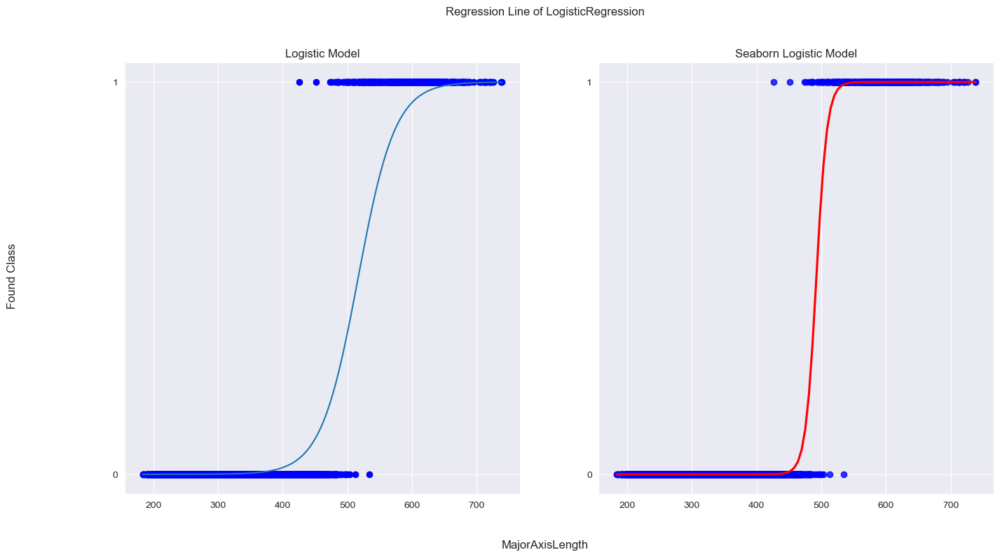

In [17]:
# Import and setup our data.
x = beandata['MajorAxisLength'].to_numpy().reshape(-1, 1)
dummy = pd.get_dummies(beandata['Class'].values)
y = dummy['BOMBAY'].values

# Create out LogisticRegression Model.
# Uses the liblinear solver and a set random_state.
model = LogisticRegression(solver='liblinear', random_state=123).fit(x, y)
y_pred = model.predict_proba(x)

y_line = []
for i in range(len(y_pred)):
    y_line.append(y_pred[i][1])

y_line = np.array(y_line)
sorted(y_line)

# Set up the Sub-Plot Figure.
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
# Set up Figure Specs.
fig.suptitle('Regression Line of LogisticRegression')
fig.supxlabel('MajorAxisLength')
fig.supylabel('Found Class')
# Set up Sub-Plot Specs.
ax1.title.set_text('Logistic Model')
ax1.yaxis.set_ticks((0, 1))
ax2.title.set_text('Seaborn Logistic Model')
ax2.yaxis.set_ticks((0, 1))

# Using my predicted and modeled curve.
ax1.scatter(x, y, color='Blue')
ax1.set_ylim(-0.05, 1.05)
sns.lineplot(x=x.flatten(), y=y_line.flatten(), ax=ax1)

# Using the built-in logistic regression from Seaborn.
sns.regplot(x=x, y=y, logistic=True, ax=ax2, scatter_kws={"color": 'Blue'}, line_kws={"color": 'Red'}, ci=None) # Create a logistic regression comparison.

Task 2.8: Use the score() method to evaluate the accuracy of the model.

In [18]:
logistic_score = model.score(x, y)
print(logistic_score)

0.9973550804496363


Task 2.9: How would you describe the accuracy value? Write your answer in your own words here:

In [19]:
answer = "Answer:\nFrom what I've figured out reading online and in the course material, regression model classifications tends to have lower ranges of prediction"
answer2 = "\nFrom this, I can surmise that a range of 50-70% is considered 'Acceptable', thus I consider 58.0046% to be 'decent enough'"
print(answer, answer2)

Answer:
From what I've figured out reading online and in the course material, regression model classifications tends to have lower ranges of prediction 
From this, I can surmise that a range of 50-70% is considered 'Acceptable', thus I consider 58.0046% to be 'decent enough'


Task 2.10: Let's say we are still only interested in the Bombay beans of Task 2. Use Scikit-learn to build a Gaussian Naive Bayes (GaussianNB) predictor based on the major axis length of the beans to separate Bombay beans from other beans. Plot the regression curve in the same figure with the corresponding scatterplot. That is, repeat Task 2.7 but this time with the GaussianNB classifier.

<AxesSubplot:>

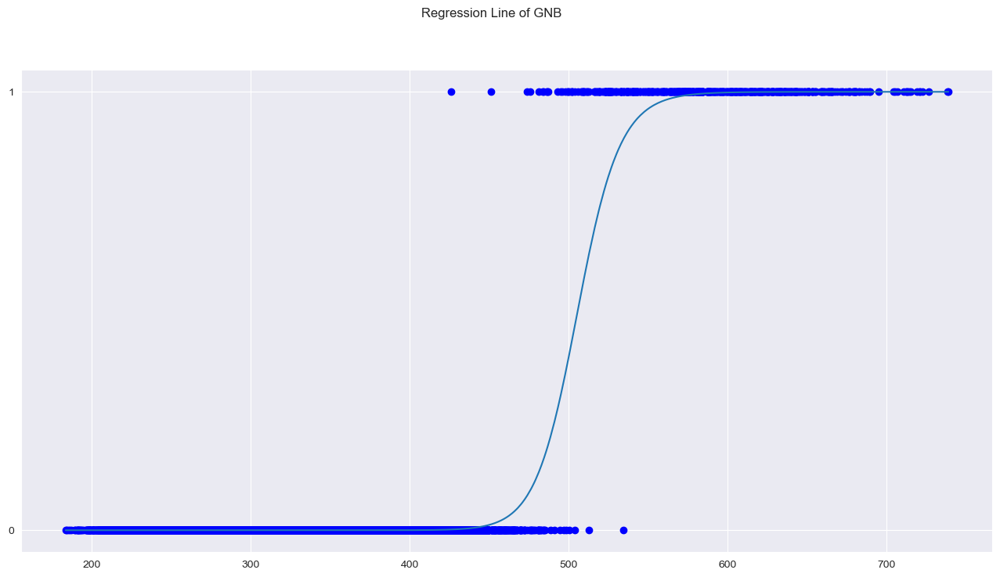

In [20]:
x = beandata['MajorAxisLength'].to_numpy().reshape(-1, 1)
dummy = pd.get_dummies(beandata['Class'].values)
y = dummy['BOMBAY'].values

model = GaussianNB().fit(x, y)
y_pred = model.predict_proba(x)
fig, ax = plt.subplots(figsize=(16, 8))
fig.suptitle('Regression Line of GNB')
ax.yaxis.set_ticks((0, 1))

y_line = []
for i in range(len(y_pred)):
    y_line.append(y_pred[i][1])

y_line = np.array(y_line)
sorted(y_line)

# Using my predicted and modeled curve.
ax.scatter(x, y, color='Blue')
#ax.plot(x, y_pred, color='Red')
ax.set_ylim(-0.05, 1.05)
sns.lineplot(x=x.flatten(), y=y_line.flatten(), ax=ax)



Task 2.11: Use the score() method to evaluate the accuracy of the GaussianNB model.

In [21]:
gnb_score = model.score(x, y)
print(gnb_score)

0.9982367202997575


Task 2.12: How many beans did the classifier misclassify?

In [26]:
print("Answer:\nNumber of mislabeled points out of a total %d points : %d" % (x.shape[0], (y != model.predict(x)).sum()))

Answer:
Number of mislabeled points out of a total 13611 points : 24


Task 2.13: How would you comment the results in your own words? Compare the logistic regression model and the Gaussian Naive Bayes model performance. Write your answer in your own words here:

In [ ]:
answer = "The resulting accuracy difference is rather small however as we can see by the regression curves the GNB curve seems a bit more 'Pessimistic' compared to the Logistic curve."
answer2 = "\n\nYou can see this by the GNB curve including more 0 (not Bombay bean) results, as it starts going upwards at around 450-460 in MAL."
answer3 = "\nWhile if you look at the Logistic curve it includes less 0 results, as it starts going upwards around 400-410 in MAL."
answer4 = f"\n\nAccuracy Difference between Logistic and GNB: {abs(logistic_score - gnb_score)}, so roughly {'{0:.17f}%'.format(abs(logistic_score - gnb_score) * 100)} difference."
print(answer, answer2, answer3, answer4)